# Richter's Predictor: Modeling Earthquake Damage

## FINAL PROJECT by SaVaNa team

#### Team members:
* **Sa**sha Selivanov
* **Va**dik Selutin
* **Na**tasha Uspenskaia

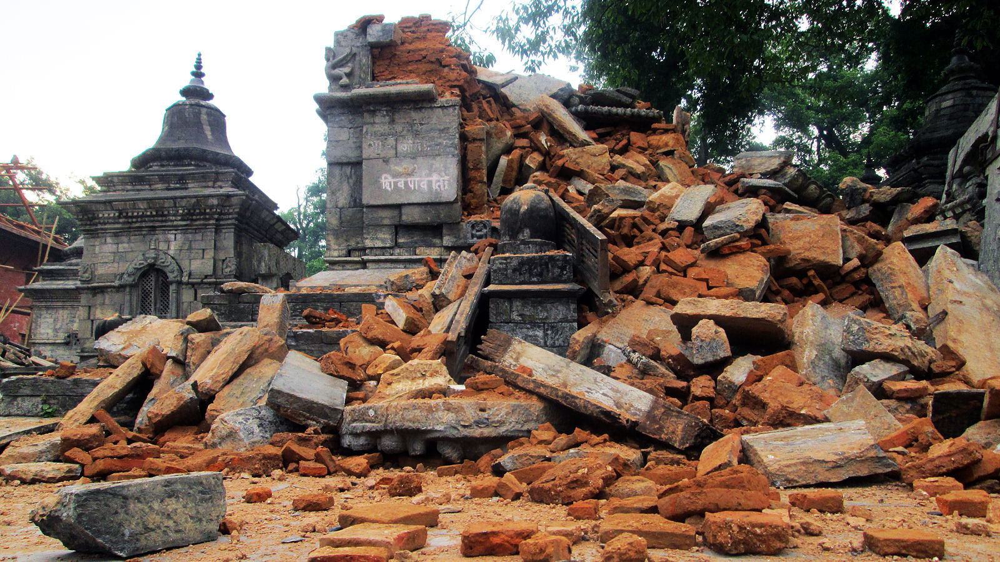

In [27]:
from IPython.display import Image
Image("nepal-quake-bm-2.jpg")

## Problem Statement

Our dataset contains information on the buildings' structure and their legal ownership.

Training sample contains records of 260601 specific buildings in the region that was hit by Gorkha earthquake. Buildings are classified into 3 classes (1 - low damage, 2 - medium damage, 3 - complete destruction). 

Test sample contains 86868 rows which are used to determine the winners of the competition (Driven Data).

The classification goal is to predict damage grade for the specific building (variable y). This allows us to detect buildings which are under the risk of destruction and assist the government for their reconstruction.

In order to solve this problem and build a good predictive model we need to define the type of the algorithm to use. We will try Random Forest, kNN, Logistic regression and Ridge Classifier.

Source: https://www.drivendata.org/competitions/57/nepal-earthquake/

# Modeling Earthquake Damage

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')




Loading the data with Index column as Building ID

In [2]:
X = pd.read_csv('train_values.csv',index_col = 'building_id')

In [3]:
X.head(10)

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
building_id,,,,,,,,,,,,,,,,,,,,,
802906,6,487,12198,2,30,6,5,t,r,n,...,0,0,0,0,0,0,0,0,0,0
28830,8,900,2812,2,10,8,7,o,r,n,...,0,0,0,0,0,0,0,0,0,0
94947,21,363,8973,2,10,5,5,t,r,n,...,0,0,0,0,0,0,0,0,0,0
590882,22,418,10694,2,10,6,5,t,r,n,...,0,0,0,0,0,0,0,0,0,0
201944,11,131,1488,3,30,8,9,t,r,n,...,0,0,0,0,0,0,0,0,0,0
333020,8,558,6089,2,10,9,5,t,r,n,...,1,0,0,0,0,0,0,0,0,0
728451,9,475,12066,2,25,3,4,n,r,n,...,0,0,0,0,0,0,0,0,0,0
475515,20,323,12236,2,0,8,6,t,w,q,...,0,0,0,0,0,0,0,0,0,0
441126,0,757,7219,2,15,8,6,t,r,q,...,0,0,0,0,0,0,0,0,0,0


Shape of our Data

In [4]:
X.shape

(260601, 38)

The same for Train labels

In [5]:
y = pd.read_csv('train_labels.csv', index_col = 'building_id')

In [0]:
y.head(10)

,damage_grade
building_id,
802906,3
28830,2
94947,3
590882,2
201944,3
333020,2
728451,3
475515,1
441126,2


The description of our data

In [0]:
X.describe()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
count,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,13.900353,701.074685,6257.876148,2.129723,26.535029,8.018051,5.434365,0.088645,0.761935,0.034332,0.018235,0.068154,0.075268,0.254988,0.085011,0.042590,0.015859,0.014985,0.983949,0.111880,0.064378,0.033626,0.008101,0.000940,0.000361,0.001071,0.000188,0.000146,0.000088,0.005119
std,8.033617,412.710734,3646.369645,0.727665,73.565937,4.392231,1.918418,0.284231,0.425900,0.182081,0.133800,0.252010,0.263824,0.435855,0.278899,0.201931,0.124932,0.121491,0.418389,0.315219,0.245426,0.180265,0.089638,0.030647,0.018989,0.032703,0.013711,0.012075,0.009394,0.071364
min,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,350.000000,3073.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,12.000000,702.000000,6270.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,21.000000,1050.000000,9412.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,30.000000,1427.000000,12567.000000,9.000000,995.000000,100.000000,32.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [0]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260601 entries, 802906 to 747594
Data columns (total 38 columns):
geo_level_1_id                            260601 non-null int64
geo_level_2_id                            260601 non-null int64
geo_level_3_id                            260601 non-null int64
count_floors_pre_eq                       260601 non-null int64
age                                       260601 non-null int64
area_percentage                           260601 non-null int64
height_percentage                         260601 non-null int64
land_surface_condition                    260601 non-null object
foundation_type                           260601 non-null object
roof_type                                 260601 non-null object
ground_floor_type                         260601 non-null object
other_floor_type                          260601 non-null object
position                                  260601 non-null object
plan_configuration                        2606

### Some of columns are Float, some Integer and some are Objects!

How many NaNs are in our Data

In [0]:
X.isnull().sum()

geo_level_1_id                            0
geo_level_2_id                            0
geo_level_3_id                            0
count_floors_pre_eq                       0
age                                       0
area_percentage                           0
height_percentage                         0
land_surface_condition                    0
foundation_type                           0
roof_type                                 0
ground_floor_type                         0
other_floor_type                          0
position                                  0
plan_configuration                        0
has_superstructure_adobe_mud              0
has_superstructure_mud_mortar_stone       0
has_superstructure_stone_flag             0
has_superstructure_cement_mortar_stone    0
has_superstructure_mud_mortar_brick       0
has_superstructure_cement_mortar_brick    0
has_superstructure_timber                 0
has_superstructure_bamboo                 0
has_superstructure_rc_non_engine

# Let's visualize our Data and do some simple preprocessing

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Age distribution

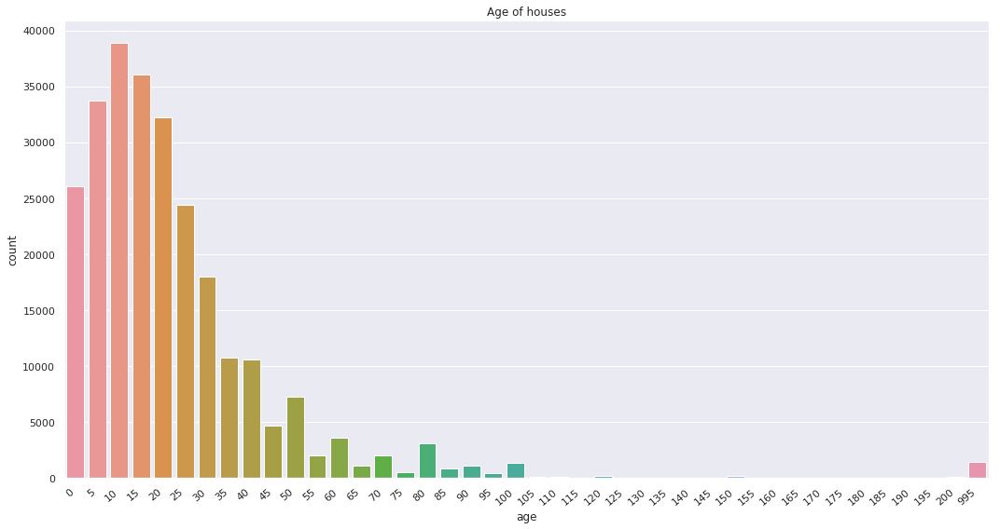

In [0]:
plt.figure(figsize= (15,8))
ax = sns.countplot(x='age', data=X)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.title('Age of houses')
plt.tight_layout()
plt.show()

We can see here some outliers!

In [7]:
data = X

In [8]:
data['damage'] = y

## Let's look on correlation map

### On this plot we can see features correlated with Damage 

In [0]:
correlation = pd.DataFrame.corr(data)

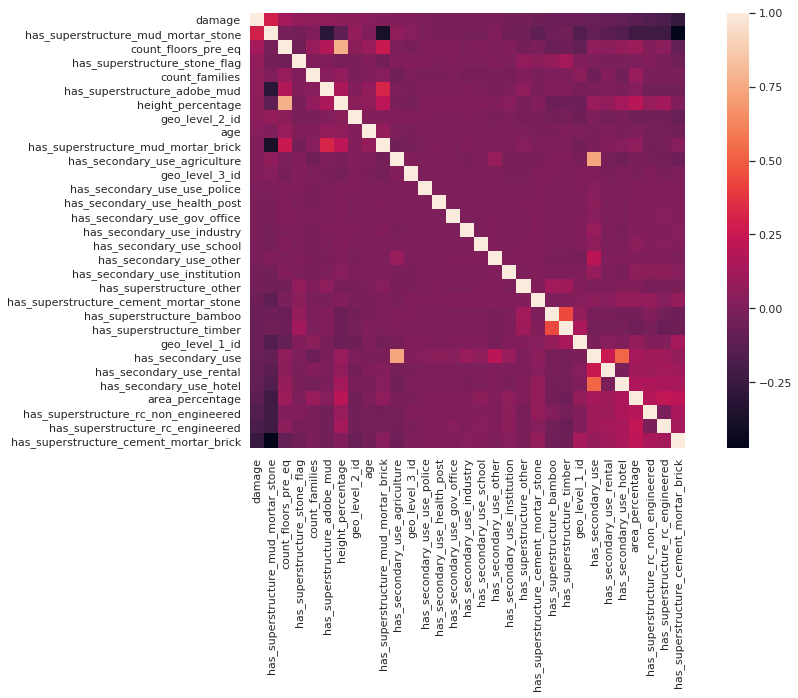

In [0]:
plt.figure(figsize = [15,8])
columns = correlation.nlargest(39, 'damage').index
correlation_map = np.corrcoef(data[columns].values.T)
sns.set(font_scale=1.0)
heatmap = sns.heatmap(correlation_map, cbar=True, annot=False, square=True, fmt='.2f', yticklabels=columns.values, xticklabels=columns.values)
plt.xticks(rotation = 'vertical')
plt.show()

## First look on correlation map.

We see a high correltion between count_floors_pre_eq and height_percentage. Lets drop one of them as our goal is to use less but the most efficient features. Moreover, count_floors_pre_eq has a higher correlation with our target that's why we will drop height_percentage.
 
According to the same logic we remain has_secondary_use_agriculture and drop has_secondary_use.

In [9]:
data.drop('height_percentage',axis = 1, inplace = True)
data.drop('has_secondary_use', axis = 1, inplace = True)

## Let's look at the balance in our dataset.

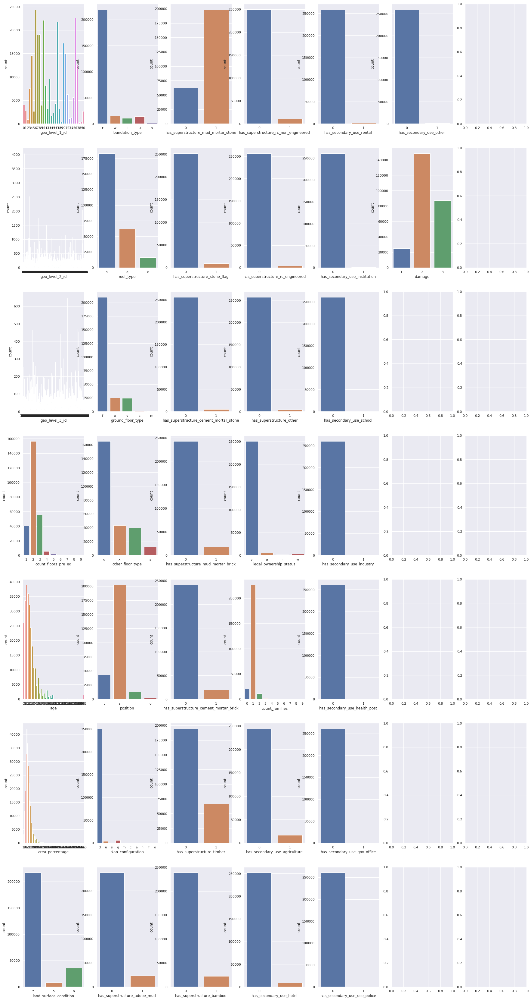

In [0]:
fig, axis = plt.subplots(7,7, figsize=(30, 60))
for i, j in enumerate(data.columns):
    sns.countplot(x=j, data=data, ax=axis[i%7, int(i/7)])

As you can see there are several features with the distribution of different values about 99.99% and 0.01%. 


In [0]:
data.has_secondary_use_gov_office.value_counts()

0    260563
1        38
Name: has_secondary_use_gov_office, dtype: int64

In [0]:
data.has_secondary_use_use_police.value_counts()

0    260578
1        23
Name: has_secondary_use_use_police, dtype: int64

In [0]:
data.has_secondary_use_health_post.value_counts()

0    260552
1        49
Name: has_secondary_use_health_post, dtype: int64

In [0]:
data.has_secondary_use_industry.value_counts()

0    260322
1       279
Name: has_secondary_use_industry, dtype: int64

In [0]:
data.has_secondary_use_school.value_counts()

0    260507
1        94
Name: has_secondary_use_school, dtype: int64

In [0]:
data.has_secondary_use_institution.value_counts()

0    260356
1       245
Name: has_secondary_use_institution, dtype: int64

The amount of different values of these features is too small so we drop these columns as they don't seem to matter much.

In [10]:
data.drop('has_secondary_use_gov_office', axis = 1, inplace = True)
data.drop('has_secondary_use_use_police', axis = 1, inplace = True)
data.drop('has_secondary_use_health_post', axis = 1, inplace = True)
data.drop('has_secondary_use_industry', axis = 1, inplace = True)
data.drop('has_secondary_use_school', axis = 1, inplace = True)
data.drop('has_secondary_use_institution', axis = 1, inplace = True)

Let's have a look at the balance of values in our target.

In [0]:
for cls in np.unique(data.damage):
    print('{}: {:.2f}%'.format(cls, sum(data.damage == cls)*1.0/len(data.damage)*100))

1: 9.64%
2: 56.89%
3: 33.47%


So the data is not balanced and that's why accuracy won't be suitable (because the most part of the test set can contain samples of the first class which will be predicted correctly and this will give a high accuracy but we won't take into account that the algorithm will make mistakes on the samples of zero class). In case of imbalanced problem  micro averaged f1 score will be used.

## Let's look on feature, which intuition says the most important in this case - Age

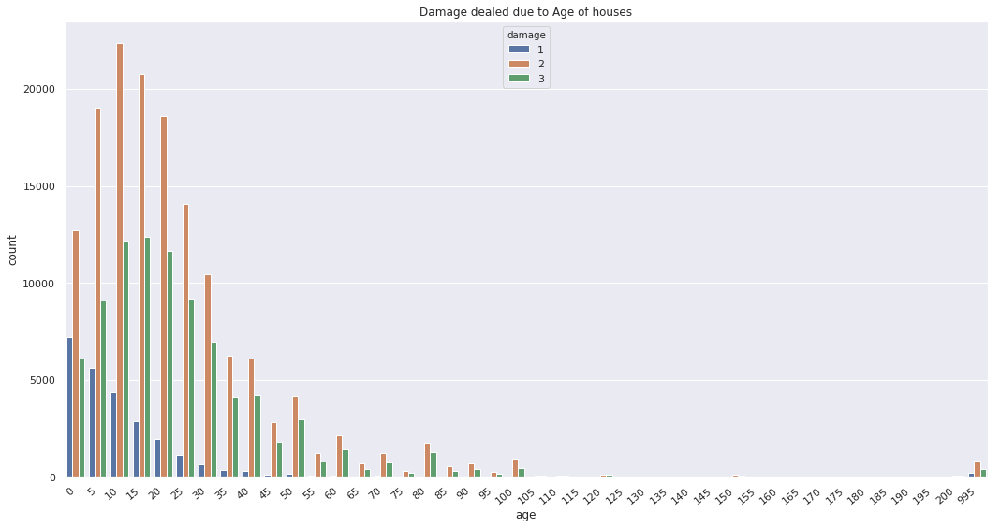

In [0]:
plt.figure(figsize= (15,8))
ax = sns.countplot(x='age', data=data, hue='damage', )
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.title('Damage dealed due to Age of houses')
plt.tight_layout()
plt.show()

## It looks like the damage is normally distributed!
## Classes are unbalanced.
## We see some houses with age 900+ on our graph. Let's consider them as outliers.

In [11]:
data = data[data['age'] < np.quantile(data['age'], 0.99)]

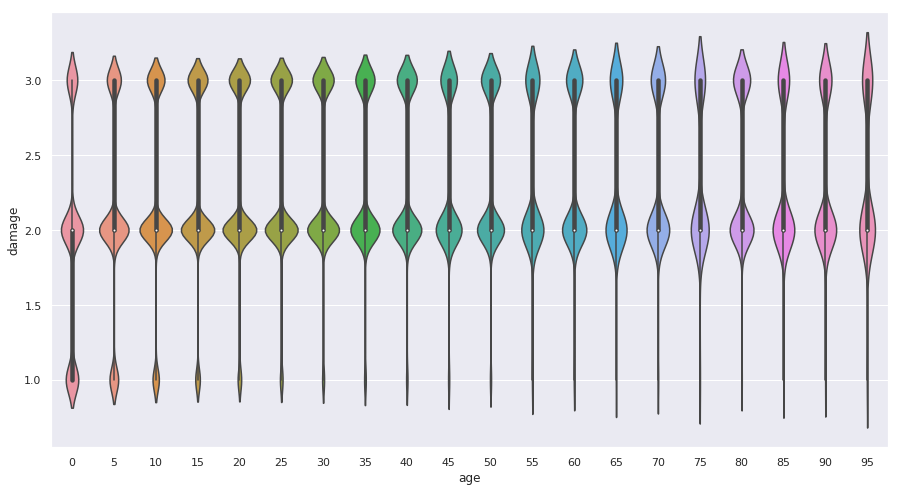

In [0]:
plt.figure(figsize = [15,8])
sns.violinplot(y='damage',x='age',data=data)
plt.show()

## Almost all ages got most 2 type of damage

## 3D visualization of Data

In [32]:
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

fig = go.Figure(data = go.Volume(x = data['age'].ravel(),
                y = data['count_floors_pre_eq'].ravel(),
                z = data['area_percentage'].ravel(),
                value = data['damage'].ravel(),
                opacity=0.1, surface_count=21))

camera = dict(
    eye=dict(x=1, y=1, z=1)
)

fig.update_layout(scene_camera=camera, title= 'Age Volume and damage done' )

fig.show()

## Let's look on distribution of Damage due to Region


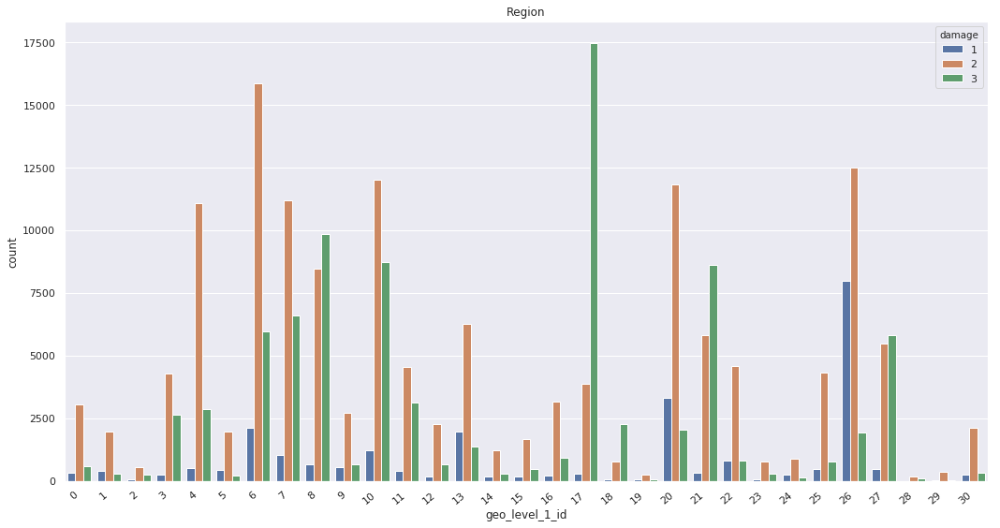

In [0]:
plt.figure(figsize= (15,8))
ax = sns.countplot(x='geo_level_1_id', data=data, hue='damage', )
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.title('Region')
plt.tight_layout()
plt.show()

## From this plot we can detect regions with high seismic activity. For example region number 17 and 6

### As we see on correlation map Geo_level_1_id is less correlated with damage than 2 other features of region. And from our intuition this feature isn't very important for us.

### We consider that geo_level_2_id and geo_level_3_id, which are give more localised information of region is more important.

In [12]:
data.drop('geo_level_1_id', inplace=True, axis=1)

## Now let's look on feature which is correlated with damage the most

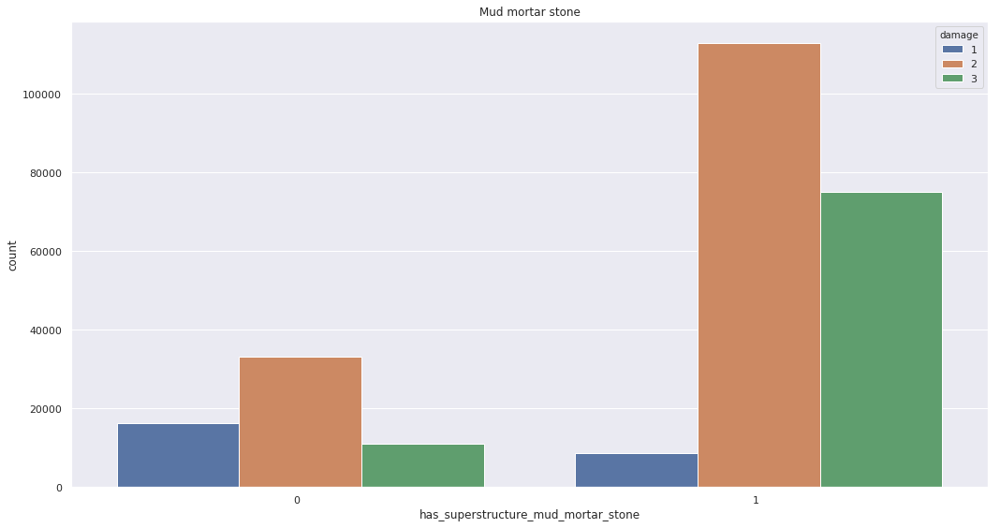

In [0]:
plt.figure(figsize= (15,8))
ax = sns.countplot(x=data['has_superstructure_mud_mortar_stone'], data=data, hue='damage', )
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha="right")
plt.title('Mud mortar stone')
plt.tight_layout()
plt.show()

## There is a huge difference between damage dealed to houses if they had Mud Mortar Stone or not

# Feature Engeneering

### OneHot Encoding - it is needed because some of our data is encrypted with random letters

In [13]:
data = pd.get_dummies(data, columns=['land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type', 'other_floor_type',
                                      'position', 'plan_configuration', 'legal_ownership_status'])

In [14]:
X = data.drop('damage',axis = 1)
y = data['damage']

In [0]:
X.shape[1]

59

## We think that we have too much features on this step, let's see if there are some not so important by another methods.

### Let's look for 45 Best features

In [15]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif,chi2

bestfeatures = SelectKBest(score_func=f_classif, k=45) # chi2 or f_classif, tbd
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)


featureScores = pd.concat([dfcolumns,dfscores], axis=1)
featureScores.columns = ['Features','Score']  
fs = featureScores.nlargest(45,'Score')

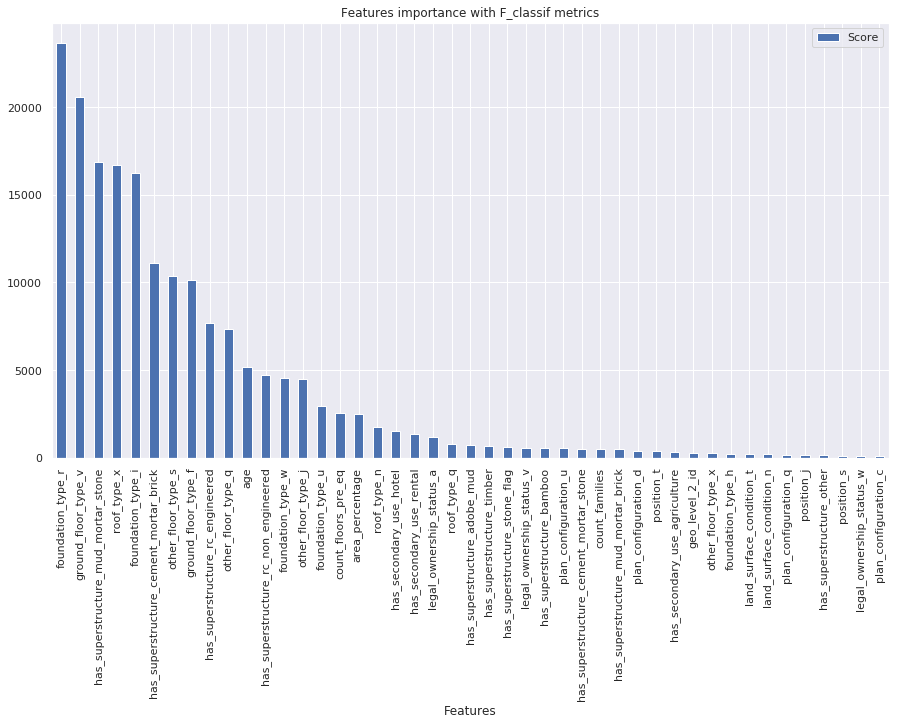

In [0]:
fs.plot(kind = 'bar', x = 'Features',y = 'Score',figsize = [15,8],title = 'Features importance with F_classif metrics',layout=True, grid = True)
plt.show()

### Standardization

In [16]:
from sklearn.preprocessing import StandardScaler

X = StandardScaler().fit_transform(X)

## Now let's look and try to find subset of features which gives us 96% Varience Explained

### PCA

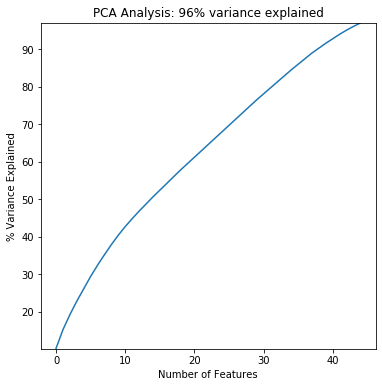

In [17]:
from sklearn.decomposition import PCA

covar_matrix = PCA(n_components = 45)
X = covar_matrix.fit_transform(X)
var = np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3) * 100)

plt.figure(figsize= (6,6))
plt.ylabel('% Variance Explained')
plt.xlabel('Number of Features')
plt.title('PCA Analysis: {}% variance explained'.format(int(max(var))))
plt.ylim(min(var) - 0.1, max(var) + 0.1)
plt.style.context('seaborn-whitegrid')
plt.plot(var)
plt.show()

In [0]:
X.shape

(257113, 45)

# Machine Learning Part

In [18]:
from sklearn.metrics import make_scorer,f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score,  KFold, StratifiedKFold, GridSearchCV
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

In [19]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv = kf.split(X, y)

## kNN

In [0]:
params_grid = {'n_neighbors': [3, 5, 7, 9, 11, 15, 17, 25, 27]}

grid_searcher = GridSearchCV(knn, params_grid, cv=cv, n_jobs=-1, scoring=make_scorer(f1_score, average='micro'))
grid_searcher.fit(X,y)

print("Best parameters values:", grid_searcher.best_params_)
print("CV Score with best parameters values:", grid_searcher.best_score_)

Best parameters values: {'n_neighbors': 25}
CV Score with best parameters values: 0.6131895314511518


In [0]:
knn = KNeighborsClassifier(n_neighbors=25)
params_grid = {'p': [1, 2]}

grid_searcher = GridSearchCV(knn, params_grid, cv=cv, n_jobs=-1, scoring=make_scorer(f1_score, average='micro'))
grid_searcher.fit(X,y)

print("Best parameters values:", grid_searcher.best_params_)
print("CV Score with best parameters values:", grid_searcher.best_score_)

Best parameters values: {'p': 1}
CV Score with best parameters values: 0.6166666018443253


## RidgeClassifier

In [0]:
ridge = RidgeClassifier(random_state=42)
params_grid = {'alpha': [10**i for i in range(-3,4)]}

grid_searcher = GridSearchCV(ridge, params_grid, cv=kf.split(X, y), n_jobs=-1, scoring=make_scorer(f1_score, average='micro'))
grid_searcher.fit(X,y)

print("Best parameters values:", grid_searcher.best_params_)
print("CV Score with best parameters values:", grid_searcher.best_score_)

Best parameters values: {'alpha': 1}
CV Score with best parameters values: 0.5826115365617452


## Logistic Regression

In [0]:
logistic = LogisticRegression(multi_class='multinomial', solver='saga', penalty='elasticnet', random_state=42)
params_grid = {'l1_ratio': np.arange(0,1.1,0.1),
               'C': np.logspace(-3,3,7)}

grid_searcher = GridSearchCV(logistic, params_grid, cv=kf.split(X, y), n_jobs=-1, scoring=make_scorer(f1_score, average='micro'))
grid_searcher.fit(X,y)

print("Best parameters values:", grid_searcher.best_params_)
print("CV Score with best parameters values:", grid_searcher.best_score_)

Best parameters values: {'C': 0.1, 'l1_ratio': 0.5}
CV Score with best parameters values: 0.5838950189216414


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/sag.py:337: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


## Random Forest

In [0]:
params = {'max_depth': [5, 10, 15, 20],
          'n_estimators': [10, 20, 40, 60, 80],
          'min_samples_leaf': [1, 5, 10, 15, 20],
          'max_leaf_nodes': [100, 200, 400]}
cv = kf.split(X, y)
rfc = RandomForestClassifier()

# Fit the grid search
grid_searcher = GridSearchCV(rfc, 
                             params, 
                             cv=cv, 
                             n_jobs=-1, 
                             scoring=make_scorer(f1_score, average='micro'),
                             verbose=50)
grid_searcher.fit(X,y)

print("Best parameter values:", grid_searcher.best_params_)
print("CV Score with best parameter values:", grid_searcher.best_score_)

Fitting 5 folds for each of 300 candidates, totalling 1500 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   32.7s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   53.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed: 

In [20]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import Perceptron
import pylab as pl
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp

In [21]:
model_rfc = RandomForestClassifier(n_estimators=80, n_jobs=-1, max_depth=20, min_samples_leaf=20, max_leaf_nodes=400)
model_lr = LogisticRegression(multi_class='multinomial', solver='saga', penalty='elasticnet', random_state=42, C=0.1, l1_ratio=0.5)
model_knn = KNeighborsClassifier(n_neighbors=25, p=1)
model_rc = OneVsRestClassifier(RidgeClassifier(random_state=42, alpha=1), n_jobs=-1)

In [22]:
def rocaucplot(model, X, y, title):
    

    # Add noisy features to make the problem harder
    random_state = np.random.RandomState(0)
    n_samples, n_features = X.shape

    # shuffle and split training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.5,
                                                        random_state=0)

    # Learn to predict each class against the other
    y_score = model.fit(X_train, y_train).predict(X_test)

    y_train = label_binarize(y_train, classes=[1, 2, 3])
    y_test = label_binarize(y_test, classes=[1, 2, 3])
    y_score = label_binarize(y_score, classes=[1, 2, 3])
    n_classes = y_train.shape[1]
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    lw = 2
    
    # Compute macro-average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # Plot all ROC curves

    plt.figure(figsize=(15, 8))
    plt.grid()
    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=4)

    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=4)

    colors = cycle(['red', 'darkorange', 'cornflowerblue'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(i+1, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title, fontsize=20)
    plt.legend(loc="lower right", prop={'size':20})
    plt.show()




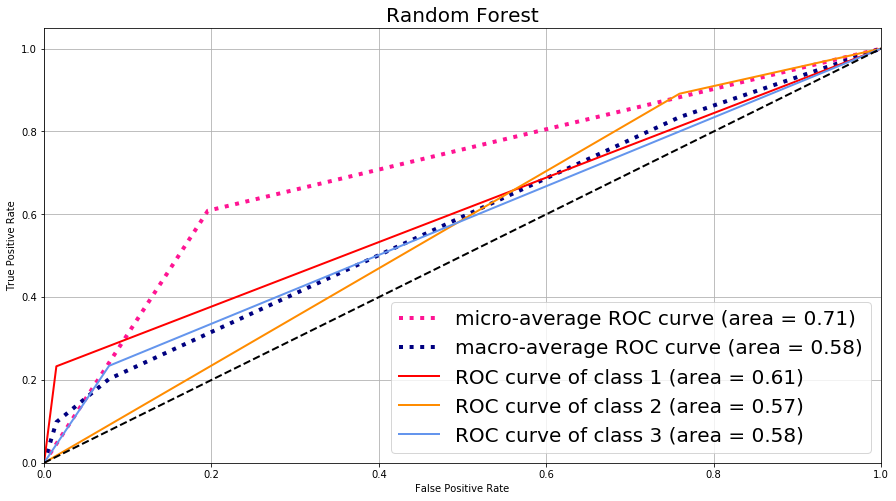

In [23]:
rocaucplot(model_rfc, X, y, 'Random Forest')

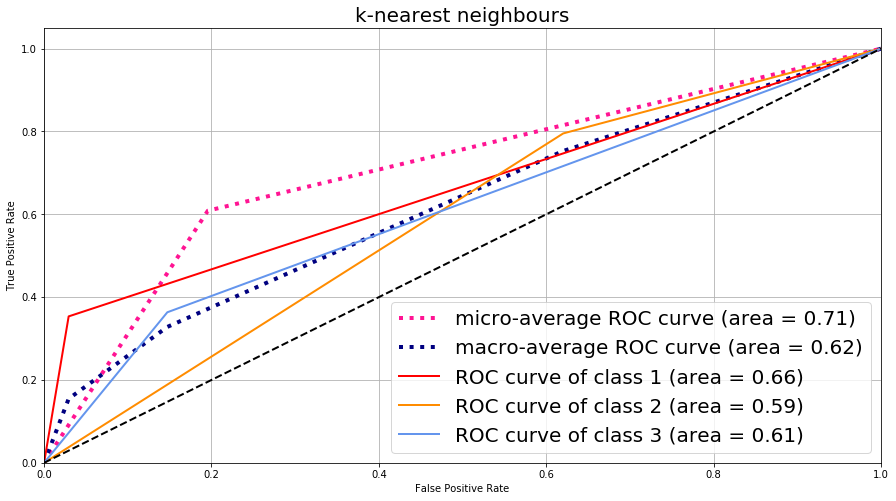

In [26]:
rocaucplot(model_knn, X, y, 'k-nearest neighbours')

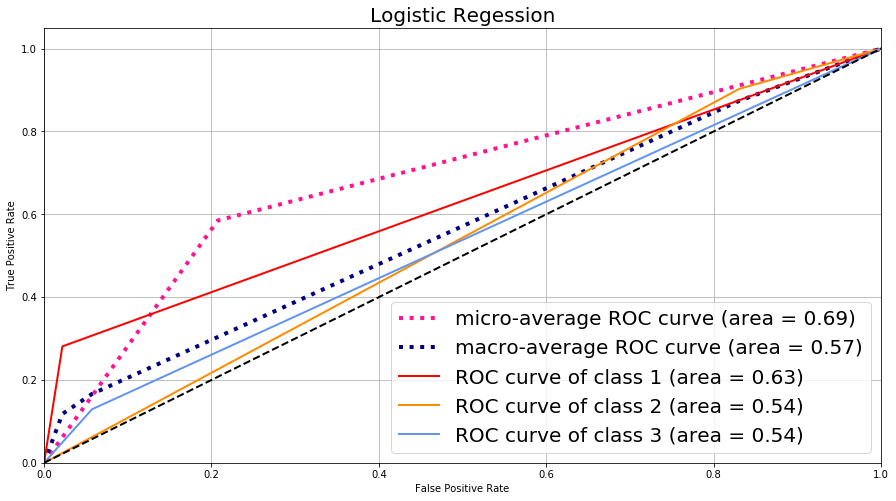

In [24]:
rocaucplot(model_lr, X, y, 'Logistic Regession')

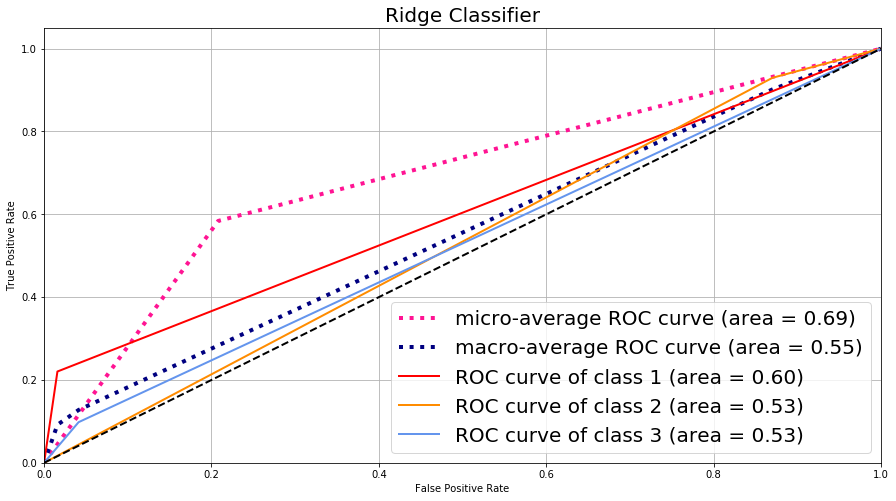

In [25]:
rocaucplot(model_rc, X, y, 'Ridge Classifier')

# Conclusion

* First of all, we tried to find any dependencies between features. We dropped those which were higly correlated or dramatically imbalanced. We also detected outliers and removed them by computing the 0.99 quantile. 
* Since most of the features are categorical, One Hot Encoding and Standardization has been proposed as the preprocessing steps for all models. 
* After visualizing the data in order to decrease the dimensionality of the problem we used PCA. From 59 features we chose the subset of 45 that gave us 96% varience explained.
* As the target variable was imbalanced we used StratifiedKfold to split our data into train and test sets.
* We needed to use multiclassification algorith ms to make accurate predictions (in particular, Logistic Regression, KNeighboours, Random Forest, Ridge Regression). With the help of GridSearchCV we found the optimal set of hyperparameters.
* Because of the imbalanced target we needed to take into account both precision and recall. The good way of doing this is to use F1-score. However, we have 3 possible labels (not binary). That's why we measured the predictability rate of our classifiers with micro averaged F1 score.
* According to this score, best result was 0.617 by kNN, next was Random Forest with 0.608, Logistic Regression and Ridge Classifier showed worse result about 0.58. 
* We weren't able to visualize different scores of optimal models as we didn't have test labels because of the competition. In order to validate and compare optimal models we splited train set again and built roc-auc curves.

#### Research impact
* The problem caused by earthquake in Nepal in 2015 is relevant and crucial. That's why building the model which can predict damage to buildings is important. Moreover, we got a better understunding of the problem. For example, which features make the biggest impact to the level of destruction.